Note: Use Python 3.9.0 (create virtual env) to run this notebook

In [ ]:
# %pip install torch
# %pip install opencv-python==4.5.5.64
# %pip install kornia
# %pip install matplotlib==3.5.1
# %pip install kornia_moons
# %pip install scikit-image==0.19.3
# %pip install numpy==1.22.4
# %pip install rembg
# %pip install onnxruntime
# %pip install torchvision


  Using cached torch-2.7.0-cp39-cp39-win_amd64.whl.metadata (29 kB)
  Using cached filelock-3.18.0-py3-none-any.whl.metadata (2.9 kB)
  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached networkx-3.2.1-py3-none-any.whl.metadata (5.2 kB)
  Using cached jinja2-3.1.6-py3-none-any.whl.metadata (2.9 kB)
  Using cached mpmath-1.3.0-py3-none-any.whl.metadata (8.6 kB)
  Using cached MarkupSafe-3.0.2-cp39-cp39-win_amd64.whl.metadata (4.1 kB)
Using cached torch-2.7.0-cp39-cp39-win_amd64.whl (212.4 MB)
Using cached sympy-1.14.0-py3-none-any.whl (6.3 MB)
Using cached mpmath-1.3.0-py3-none-any.whl (536 kB)
Using cached filelock-3.18.0-py3-none-any.whl (16 kB)
Using cached jinja2-3.1.6-py3-none-any.whl (134 kB)
Using cached MarkupSafe-3.0.2-cp39-cp39-win_amd64.whl (15 kB)
Using cached networkx-3.2.1-py3-none-any.whl (1.6 MB)

   ---------------------------------------- 0/8 [mpmath]
   ---------------------------------------- 0/8 [mpmath]
   ----------------------------------

In [ ]:
from kornia.feature import LoFTR
from kornia_moons.viz import draw_LAF_matches
import kornia.feature as KF
import kornia as K
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import os
from rembg import remove

c:\Users\CTakenaga\source\cv\loftr_revised\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Example of Using rembg for Background Removal

We will have to do this for input inspection images

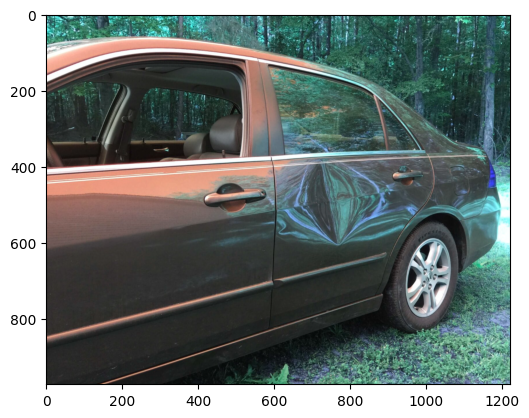

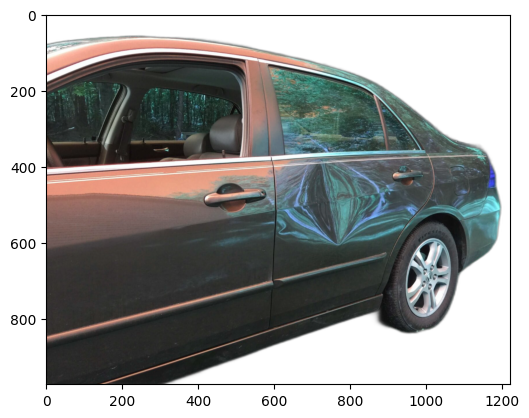

In [ ]:
img = cv2.imread("beforeBgRemoval.png")
img_bgRemove = remove(img)
cv2.imwrite("afterBgRemoval.png", img_bgRemove)

plt.imshow(img)
plt.show()
plt.imshow(img_bgRemove)
plt.show()

### Step 2: Align Image to Same View

Using LoFTR to Align "After" Image to "Before" Image. 

Note: In some cases, alignment may not be accurate if the original images are taken in very different perspectives. If LoFTR alignment lowers the SSIM between the before/after images, I reverted back to the original alignment. 

source: https://kornia.github.io/tutorials/nbs/image_matching.html

SSIM for image 1 before alignment: 0.6284581422805786
SSIM for image 1 after alignment: 0.7475018501281738


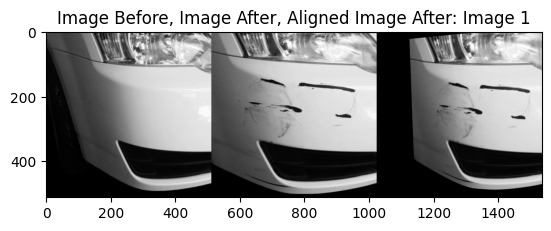

SSIM for image 2 before alignment: 0.7537720203399658
SSIM for image 2 after alignment: 0.6492922306060791
Reverting aligned after image back to original after image


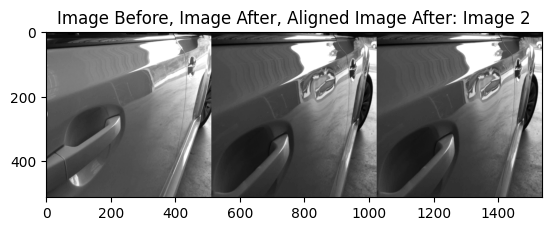

SSIM for image 3 before alignment: 0.6542040705680847
SSIM for image 3 after alignment: 0.7648216485977173


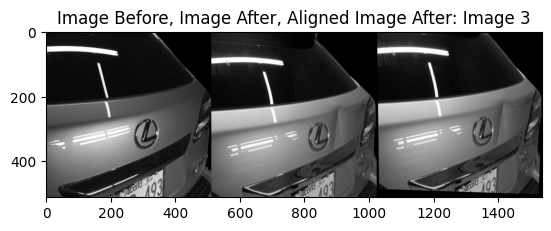

SSIM for image 4 before alignment: 0.6040191054344177
SSIM for image 4 after alignment: 0.5499644875526428
Reverting aligned after image back to original after image


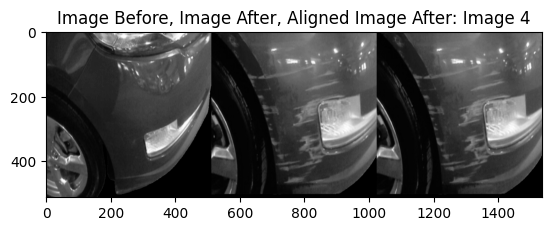

SSIM for image 5 before alignment: 0.5963467955589294
SSIM for image 5 after alignment: 0.4406973421573639
Reverting aligned after image back to original after image


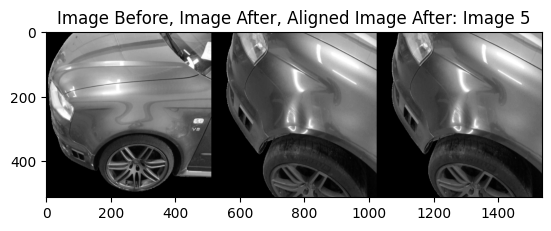

SSIM for image 6 before alignment: 0.618461012840271
SSIM for image 6 after alignment: 0.6364468336105347


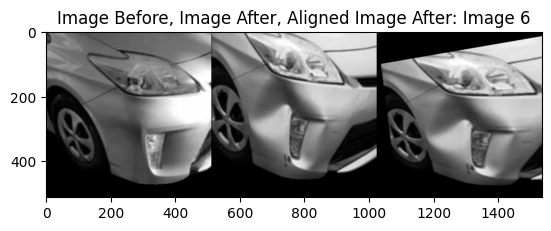

SSIM for image 7 before alignment: 0.6343973875045776
SSIM for image 7 after alignment: 0.7935940027236938


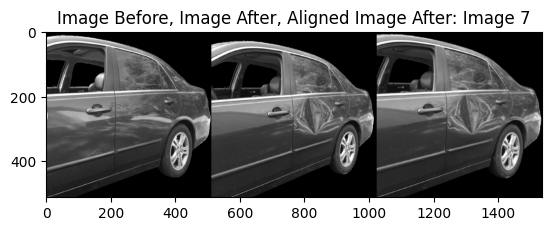

SSIM for image 8 before alignment: 0.6093369722366333
SSIM for image 8 after alignment: 0.7587178945541382


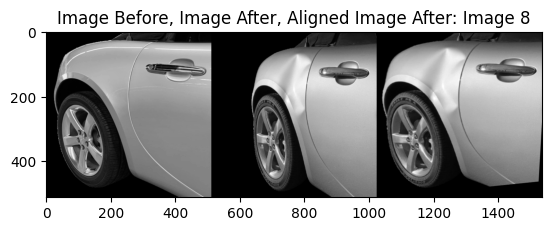

SSIM for image 9 before alignment: 0.5403244495391846
SSIM for image 9 after alignment: 0.5988212823867798


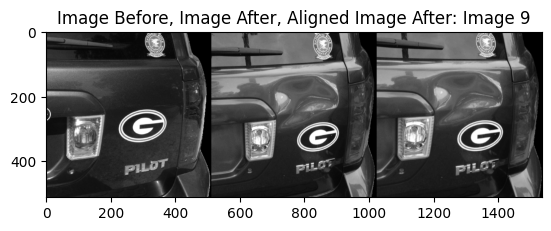

SSIM for image 10 before alignment: 0.7539669275283813
SSIM for image 10 after alignment: 0.7893837690353394


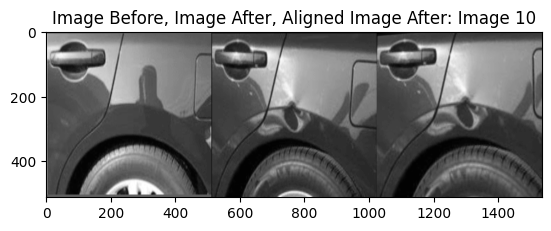

In [296]:
all_images = []
i=1
for car_folder_name in os.listdir("car_images"):
    # load in before and after images as GRAYSCALE (tensor) - *LoFTR only works on grayscale images
    img_before = K.io.load_image(os.path.join("car_images",car_folder_name, "withoutDent.png"), K.io.ImageLoadType.GRAY32)[None, ...]
    img_after = K.io.load_image(os.path.join("car_images", car_folder_name, "withDent.png"), K.io.ImageLoadType.GRAY32)[None, ...]

    # resize image (tensor)
    img_before = K.geometry.resize(img_before, (512, 512), antialias=True)
    img_after = K.geometry.resize(img_after, (512, 512), antialias=True)

    # convert back to image
    img_before_np = K.tensor_to_image(img_before)
    img_after_np = K.tensor_to_image(img_after)

    # initialize the loftr model (outdoor, indoor - not sure if it matters since we're removing backgrounds)
    matcher = LoFTR(pretrained="outdoor")
    input_dict = {"image0": img_before, "image1": img_after}

    # find corresponding matches between 2 images
    with torch.inference_mode():
        correspondences = matcher(input_dict)

    # get the keypoints from matches
    mkpts_before = correspondences["keypoints0"].cpu().numpy()
    mkpts_after = correspondences["keypoints1"].cpu().numpy()

    # find homography matrix between 2 images based on matches, and then warp image 2 to image 1 perspective
    before_h, before_w= (img_before_np.shape[0], img_before_np.shape[1])
    H, mask = cv2.findHomography(mkpts_after, mkpts_before, cv2.RANSAC, 5.0) 
    aligned_img_after = cv2.warpPerspective(img_after_np, H, (before_w, before_h))

    # Finding the ssim of the (Before Image and After Image) vs. (Before Image and Aligned After Image)
    (score,diff) = ssim(img_before_np, img_after_np, channel_axis=-1, full=True)
    print(f'SSIM for image {i} before alignment: {score}')
    (score1,diff1) = ssim(img_before_np, aligned_img_after, channel_axis=-1, full=True)
    print(f'SSIM for image {i} after alignment: {score1}')

    # if the alignment causes images to be aligned worse than before, use the original images
    if (score1 < score):
        print("Reverting aligned after image back to original after image")
        aligned_img_after = img_after_np

    all_images.append((correspondences, car_folder_name, img_before_np, img_after_np, aligned_img_after))
    
    # show the original before, original after, and aligned after images
    plt.imshow(np.hstack((img_before_np, img_after_np, aligned_img_after)), cmap='gray')
    plt.title(f"Image Before, Image After, Aligned Image After: Image {i}")
    plt.show()

    # save before, after, aligned after images to folders
    cv2.imwrite(os.path.join("aligned_after_images", f"image{i}.jpg"), 255*aligned_img_after)
    cv2.imwrite(os.path.join("before_images", f"image{i}.jpg"), 255*img_before_np)
    cv2.imwrite(os.path.join("after_images", f"image{i}.jpg"), 255*img_after_np)

    i+=1
    

### Displaying Matches using LoFTR

Just to visualize how loftr matches features between images

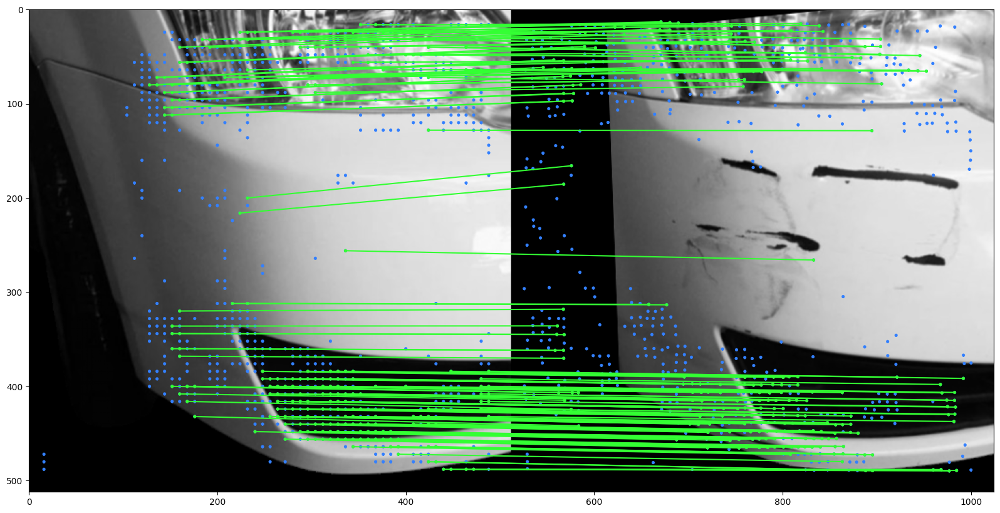

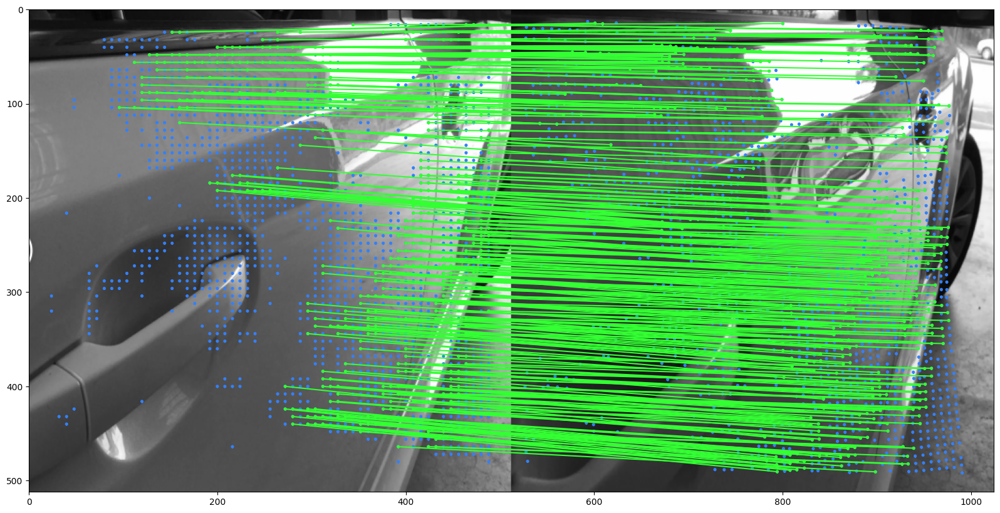

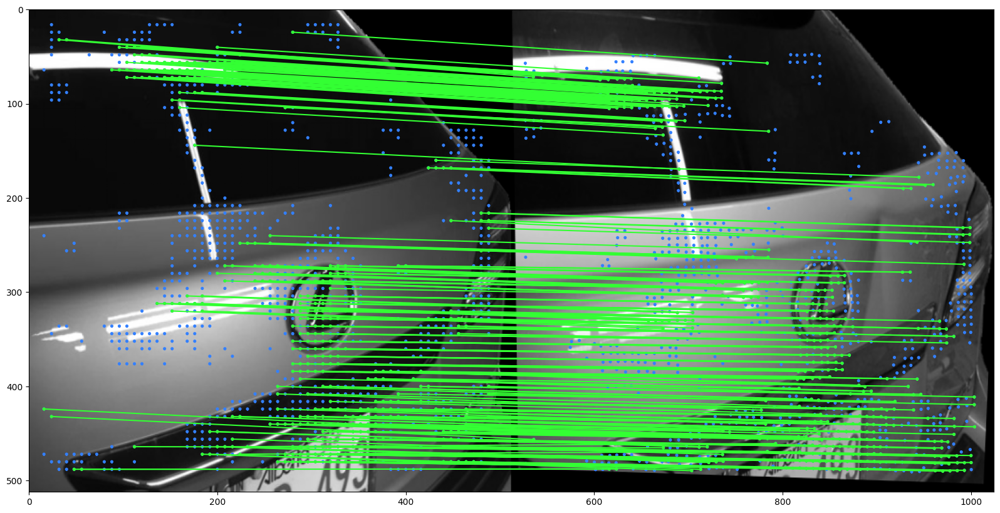

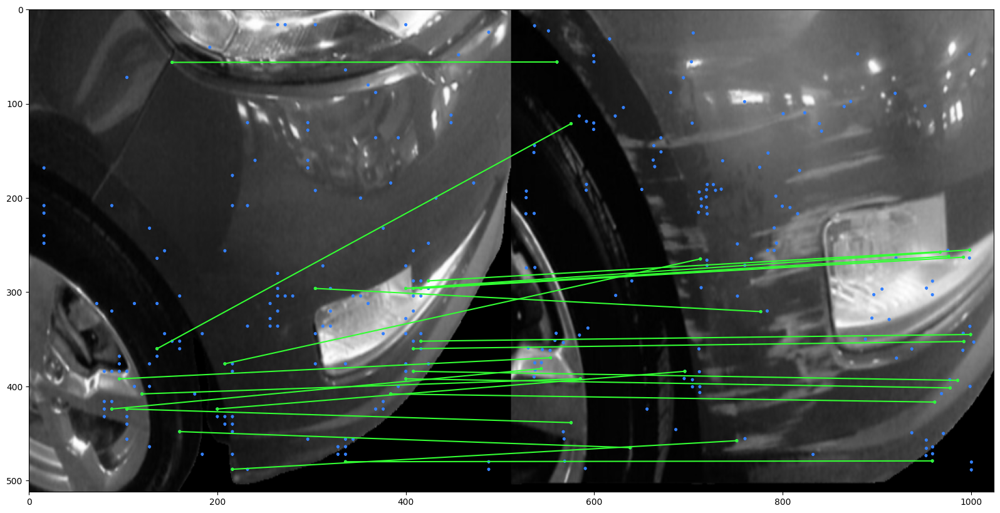

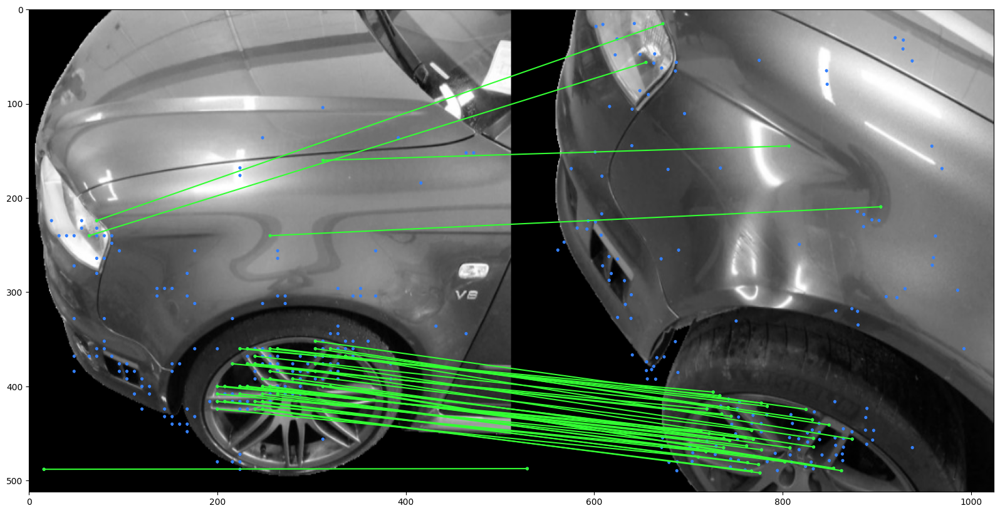

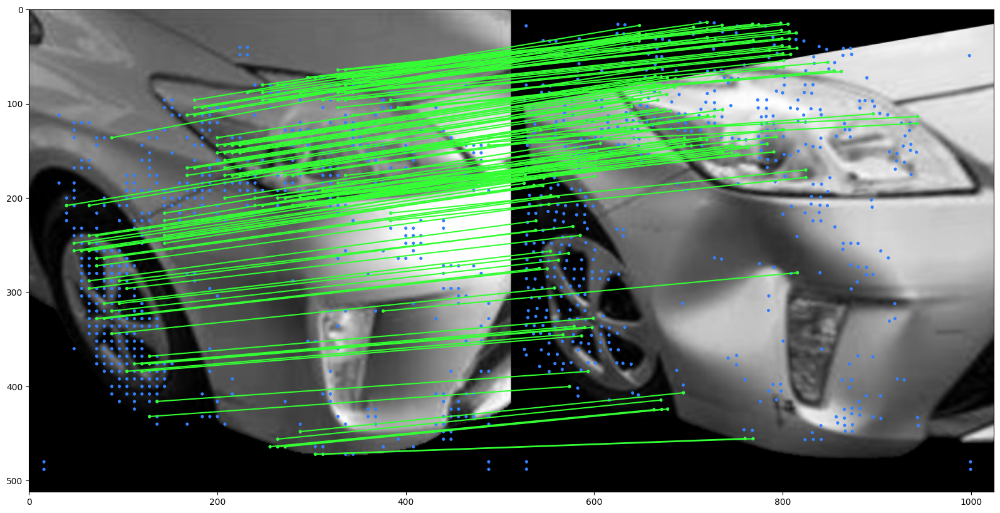

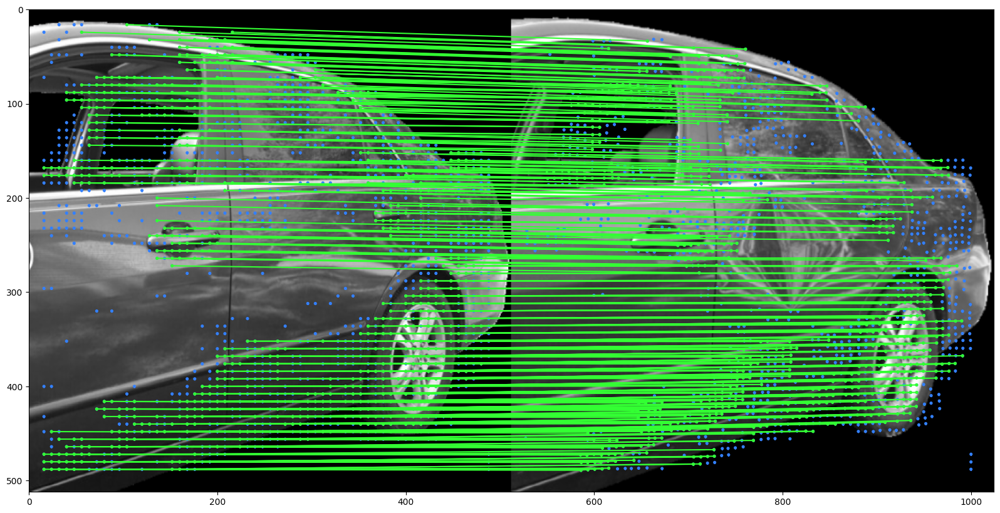

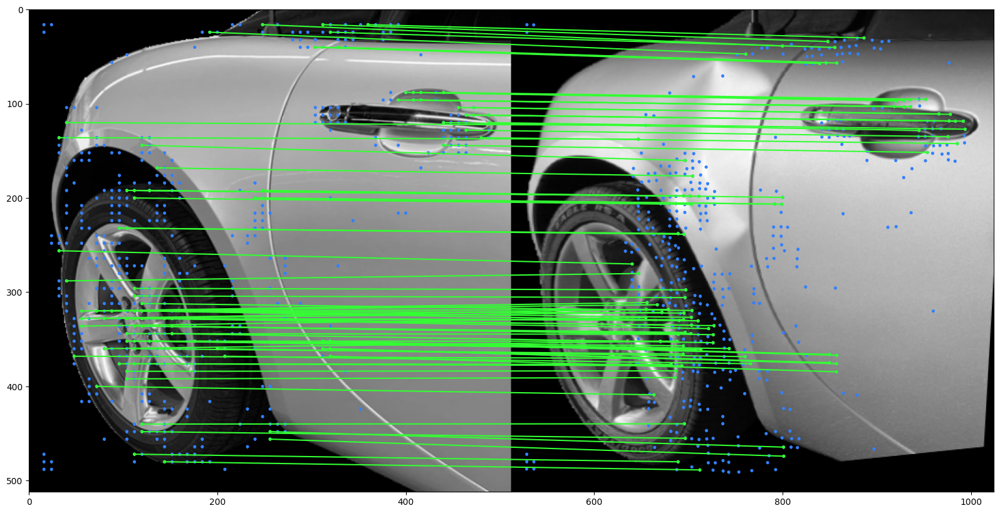

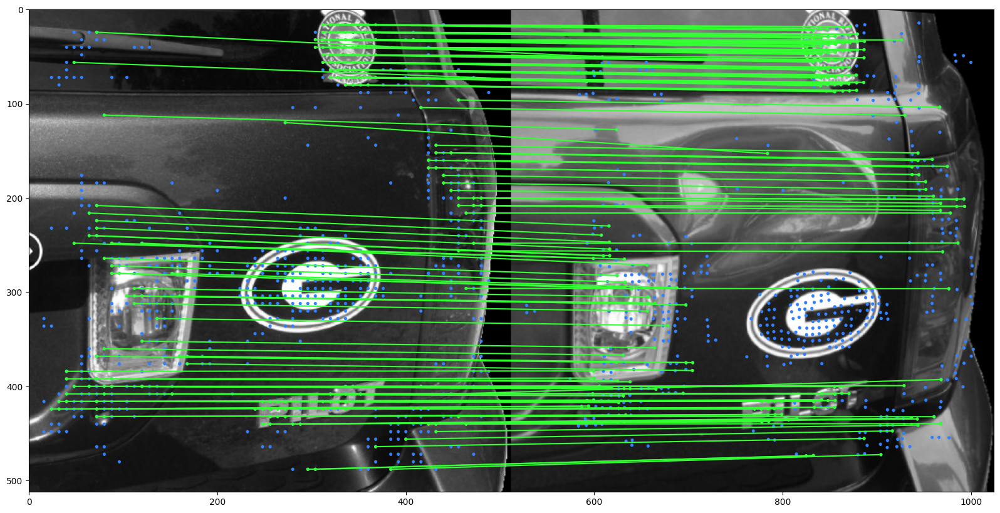

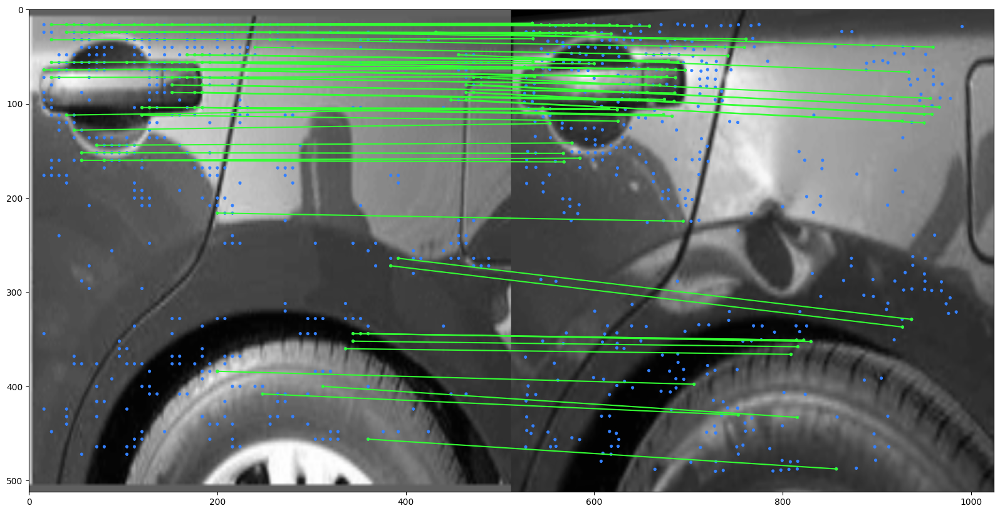

In [297]:
for correspondences, car_folder_name,img_before_np,img_after_np,aligned_img_after in all_images:

    mkpts_before = correspondences["keypoints0"].cpu().numpy()
    mkpts_after = correspondences["keypoints1"].cpu().numpy()

    img_before_rgb = cv2.cvtColor(img_before_np, cv2.COLOR_GRAY2RGB)
    img_after_rgb = cv2.cvtColor(img_after_np, cv2.COLOR_GRAY2RGB)
    aligned_img_after_rgb = cv2.cvtColor(aligned_img_after, cv2.COLOR_GRAY2RGB)
    
    # Draw correct matches in green, imprecise matches in blue
    Fm,inliers = cv2.findFundamentalMat(mkpts_before, mkpts_after, cv2.USAC_MAGSAC, 0.5, 0.999, 100000)
    inliers = inliers > 0
    draw_LAF_matches(
        KF.laf_from_center_scale_ori(
            torch.from_numpy(mkpts_before).view(1, -1, 2),
            torch.ones(mkpts_before.shape[0]).view(1, -1, 1, 1),
            torch.ones(mkpts_before.shape[0]).view(1, -1, 1),
        ),
        KF.laf_from_center_scale_ori(
            torch.from_numpy(mkpts_after).view(1, -1, 2),
            torch.ones(mkpts_after.shape[0]).view(1, -1, 1, 1),
            torch.ones(mkpts_after.shape[0]).view(1, -1, 1),
        ),
        torch.arange(mkpts_before.shape[0]).view(-1, 1).repeat(1, 2),
        img_before_rgb,
        aligned_img_after_rgb,
        inliers,
        draw_dict={"inlier_color": (0.2, 1, 0.2), "tentative_color": None, "feature_color": (0.2, 0.5, 1), "vertical": False},
    )

### Training Mask R-CNN on Custom Dataset

Approach: Train a Mask R-CNN model on a labeled dataset of car damages. Model will be trained to identify damage on cars and perform instance segmentation to find/label all damages on both Before and After images. Then, we can iterate through these masked damages and find only the damages that do NOT appear in both images. These damages will be marked as "new" damages; all others will be marked as "existing" damages.

### Detectron2 Installation

In [ ]:
# %pip install --upgrade setuptools wheel # necessary
# %pip install Cmake
# %pip install pycocotools

# %pip install -U torch torchvision --index-url https://download.pytorch.org/whl/cu118
# %pip install cython pyyaml==5.1
# %pip install -U git+https://github.com/cocodataset/cocoapi.git #subdirectory=PythonAPI

  Using cached setuptools-80.8.0-py3-none-any.whl.metadata (6.6 kB)
  Using cached wheel-0.45.1-py3-none-any.whl.metadata (2.3 kB)
Using cached setuptools-80.8.0-py3-none-any.whl (1.2 MB)
Using cached wheel-0.45.1-py3-none-any.whl (72 kB)

  Attempting uninstall: setuptools

    Found existing installation: setuptools 49.2.1

   -------------------- ------------------- 1/2 [setuptools]
    Uninstalling setuptools-49.2.1:
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
   -------------------- ------------------- 1/2 [setuptools]
      Successfully uninsta

In [ ]:
# %pip install git+https://github.com/facebookresearch/detectron2.git

  Cloning https://github.com/facebookresearch/detectron2.git to c:\users\ctakenaga\appdata\local\temp\pip-req-build-z_orh8tw
  Resolved https://github.com/facebookresearch/detectron2.git to commit 536dc9d527074e3b15df5f6677ffe1f4e104a4ab
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached termcolor-3.1.0-py3-none-any.whl.metadata (6.4 kB)
  Using cached yacs-0.1.8-py3-none-any.whl.metadata (639 bytes)
  Using cached tabulate-0.9.0-py3-none-any.whl.metadata (34 kB)
  Using cached cloudpickle-3.1.1-py3-none-any.whl.metadata (7.1 kB)
  Using cached tensorboard-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached fvcore-0.1.5.post20221221-py3-none-any.whl
  Using cached iopath-0.1.9-py3-none-any.whl.metadata (370 bytes)
  Using cached omegaconf-2.3.0-py3-none-any.whl.metadata (3.9 kB)
  Using cached hydra_core-1.3.2-py3-none-any.whl.metadata (5.5 kB)
  Using cached black-25.1.0-cp39-cp39-win_amd64.whl.metadata (81 kB)
  U

  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git 'C:\Users\CTakenaga\AppData\Local\Temp\pip-req-build-z_orh8tw'
  DEPRECATION: Building 'detectron2' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'detectron2'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [118]:
import detectron2

from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import ColorMode

### Load the Pre-trained Detectron2 Model

Datasets trained on:
- archive: https://www.kaggle.com/datasets/lplenka/coco-car-damage-detection-dataset/data
- archive_larger: https://www.kaggle.com/datasets/densus100/car-damage-coco-dataset?resource=download

In [312]:
# Load in and initialize pre-trained detectron2 model
cfg = get_cfg()
cfg.merge_from_file("../detectron2_training4/detectron2/content/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # this is the path to wherever the detectron2 folder was saved
cfg.MODEL.DEVICE ='cpu' # 'cuda' if gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 1 class (damage)
cfg.OUTPUT_DIR = "../detectron2_training4/outputs/content/outputs"
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # this is the path to wherever the outputs folder was saved
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[05/28 09:43:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ../detectron2_training4/outputs/content/outputs\model_final.pth ...


In [313]:
# saving output model predictions
all_outputs = {"aligned_images": [], "before_images": [], "after_images": [], "damage_images": []}

In [ ]:
import re

# os.listdir doesn't iterate in alphanumerical order so this is just to make sure it goes from image1, image2, ..., image10
def natural_sort_key(filename):
    match = re.search(r'image(\d+)\.jpg', filename)
    return int(match.group(1)) if match else float('inf')

### Step 3: Segment Damage Regions

Visualize Trained Model on Test Images

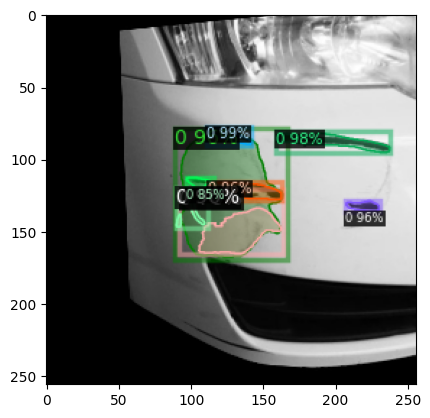

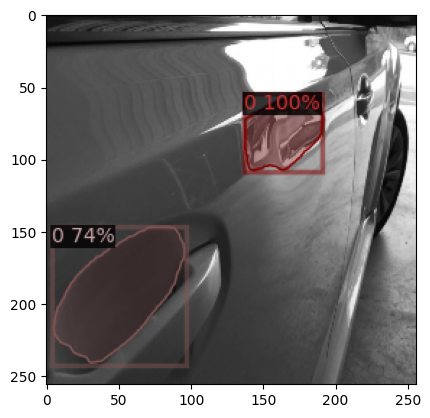

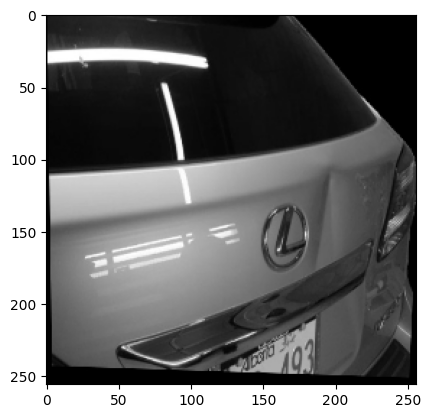

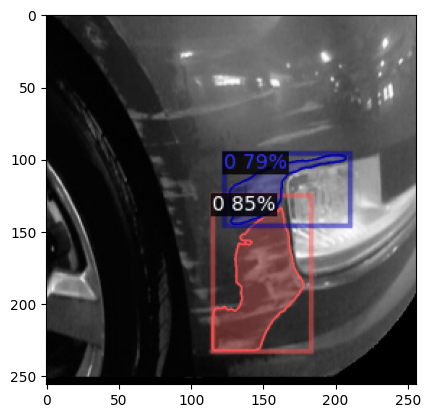

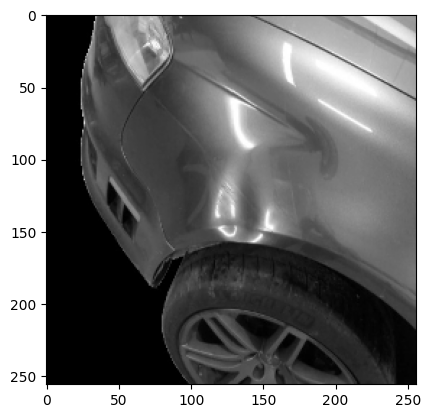

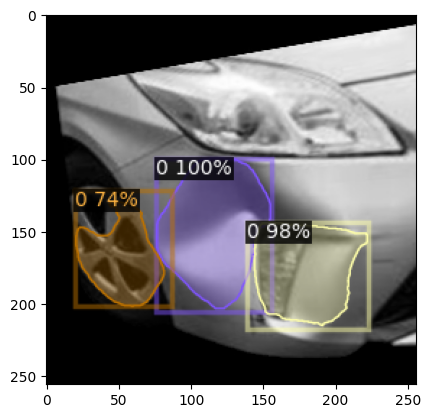

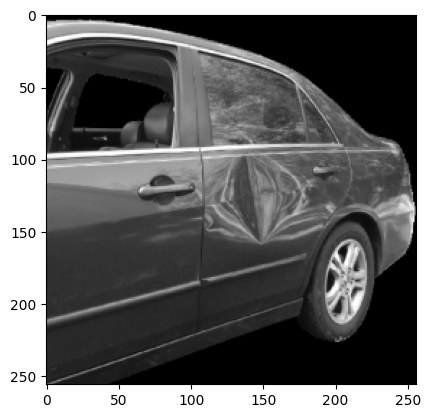

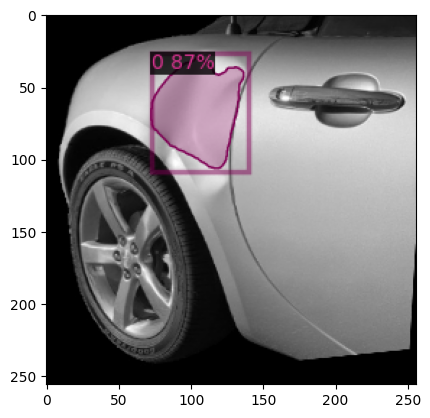

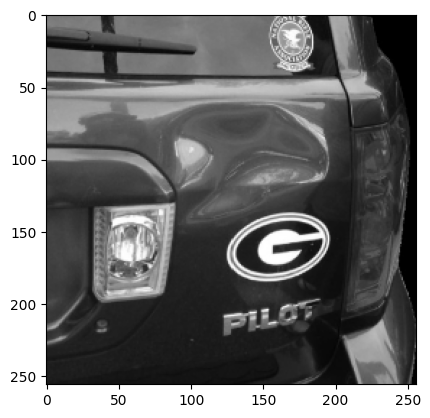

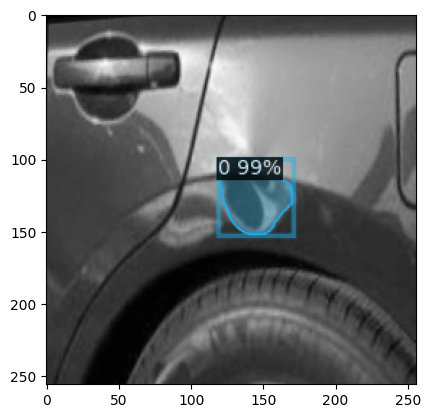

In [314]:
aligned_after_images = [img for img in os.listdir("aligned_after_images")]

# Register as a COCO dataset
register_coco_instances("aligned_images_test", {}, os.path.join("aligned_after_images", "/COCO_aligned_test_annos.json"), "aligned_after_images")
cfg.DATASETS.TEST = ("aligned_images_test",)
test_metadata = MetadataCatalog.get("aligned_images_test")

i=1
# Visualize model damage predictions on dented aligned images
files = [f for f in os.listdir("aligned_after_images")]
files.sort(key=natural_sort_key)
# print(files)
for d in files:
    filename = os.path.join("aligned_after_images", d)
    # print(filename)
    im = cv2.imread(filename)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.5, 
                instance_mode=ColorMode.IMAGE_BW  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    all_outputs["aligned_images"].append((im, outputs))
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2.imwrite(os.path.join("predictions/aligned_after_preds", f"image{i}.jpg"), out.get_image()[:, :, ::-1])
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()
    i+=1


### Results of Different Trainings

detectron2_training1: (300 iterations on smaller train dataset)
- identified 6/10 images containing damage
- incorrectly identified location of damage in 3/6 images marked as having damage

detectron2_training2: (1000 iterations on smaller train dataset)
- identified 6/10 images containing damage
- incorrectly identified location of damage in 1/6 images marked as having damage

detectron2_training3: (1000 iterations on larger train dataset)
- identified 5/10 images containing damage
- incorrectly identified location of damage in 3/5 images marked as having damage
- slightly better bounding box predictions

detectron2_training4: (3000 iterations on smaller train dataset)
- identified 6/10 images containing damage
- incorrectly identified location of damage in 3/5 images marked as having damage

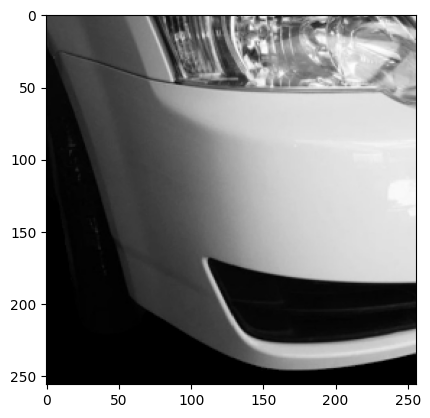

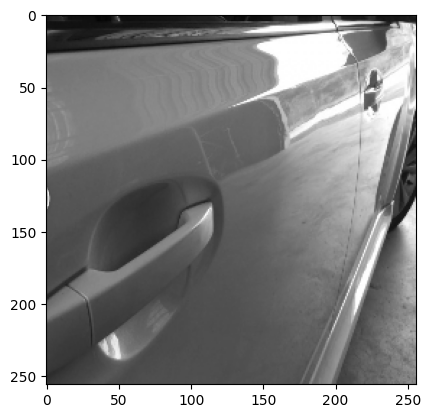

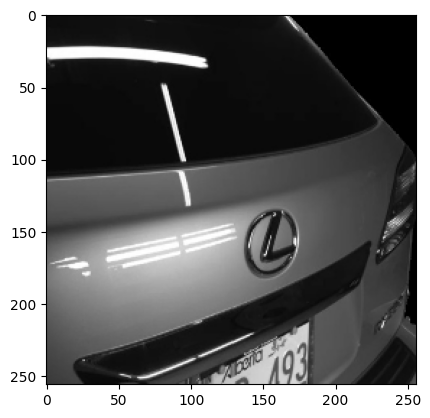

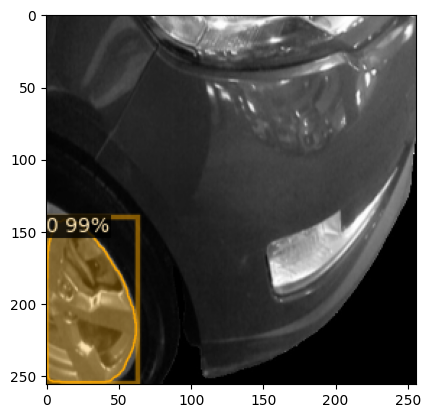

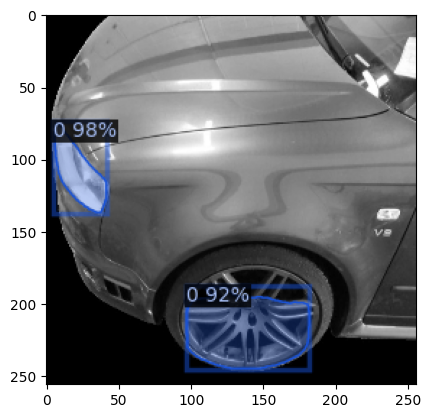

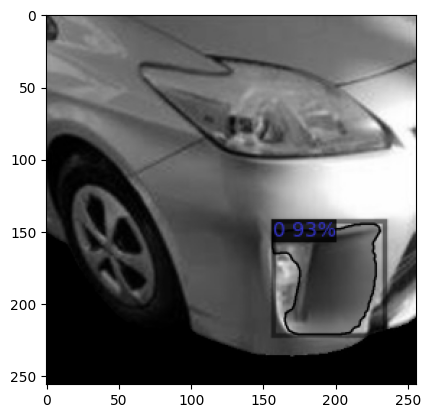

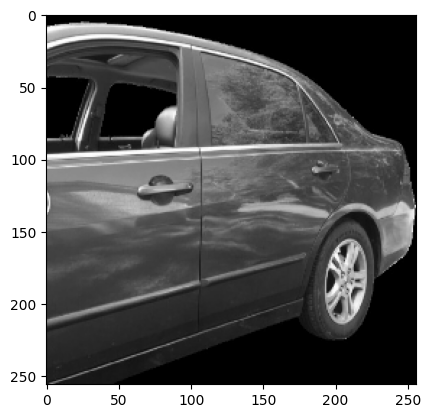

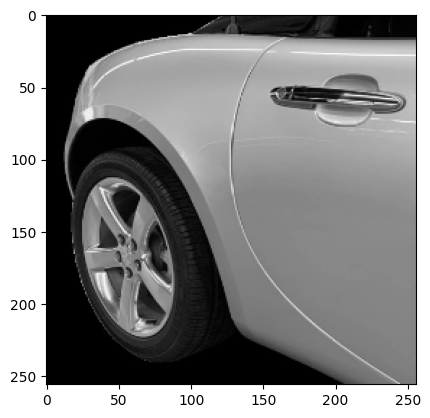

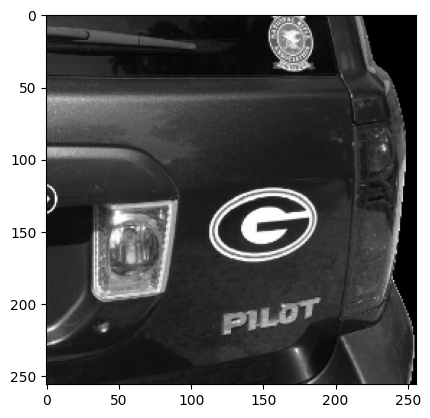

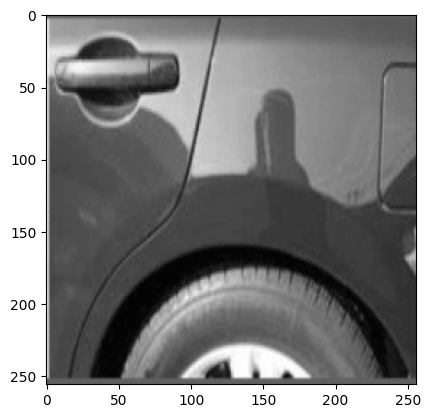

In [315]:
before_images = [img for img in os.listdir("before_images")]

# Register as a COCO dataset
register_coco_instances("before_images_test", {}, os.path.join("before_images", "/COCO_before_test_annos.json"), "before_images")
cfg.DATASETS.TEST = ("before_images_test",)
test_metadata2 = MetadataCatalog.get("after_images_test")

i=1
# Visualize model damage predictions on dented aligned images
files = [f for f in os.listdir("before_images")]
files.sort(key=natural_sort_key)
for d in files:
    filename = os.path.join("before_images", d)
    im = cv2.imread(filename)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata2,  
                scale=0.5, 
                instance_mode=ColorMode.IMAGE_BW  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    all_outputs["before_images"].append((im,outputs))
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2.imwrite(os.path.join("predictions/before_preds", f"image{i}.jpg"), out.get_image()[:, :, ::-1])
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()
    i+=1

### Results of Different Trainings

detectron2_training1: (300 iterations on smaller train dataset)
- incorrectly gave false positives for 2/10 images

detectron2_training2: (1000 iterations on smaller train dataset)
- incorrectly gave false positives for 4/10 images
- false positives are not as bad (marked shadows/reflections as damage)

detectron2_training3: (1000 iterations on larger train dataset)
- incorrectly gave false positives for 4/10 images
- worse false positives than other trainings (marked wheels or car logos as damage)

detectron2_training4: (3000 iterations on smaller train dataset)
- incorrectly gave false positives for 3/10 images
- worse false positives (marked wheels/headlights as damage - likely overgeneralizing on small dataset)

### Evaluate accuracy on annotated validation set

source: https://www.kaggle.com/datasets/lplenka/coco-car-damage-detection-dataset

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

register_coco_instances("my_dataset_val1", {}, "archive/val/COCO_val_annos.json", "archive/val")
cfg.DATASETS.TEST = ("my_dataset_val1",)
test_metadata = MetadataCatalog.get("my_dataset_val1")

# Evaluate accuracy (validation mAP) on validation set (need annotations for inference validation accuracy)
evaluator = COCOEvaluator("my_dataset_val1", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val1")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[05/27 16:52:56 d2.data.datasets.coco]: Loaded 11 images in COCO format from archive/val/COCO_val_annos.json
[05/27 16:52:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/27 16:52:56 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/27 16:52:56 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[05/27 16:52:56 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/27 16:52:56 d2.evaluation.evaluator]: Start inference on 11 batches
[05/27 16:54:00 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0012 s/iter. Inference: 1.9316 s/iter. Eval: 0.0061 s/iter. Total: 1.9388 s/iter. ETA=0:00:00
[05/27 16:54:01 d2.evaluation.evaluator]: Total inference time: 0:00:13.005448 (2.167575 s / iter per device, on 1 devices)
[05/27 16:54:01 d2.evaluation.evaluator]: Total infere

### Results of Different Trainings 


#### detectron2_training1: (300 iterations on smaller train dataset)
|  AP   |  AP50  |  AP75  |  APs  |  APm  |  APl  |
|:-----:|:------:|:------:|:-----:|:-----:|:-----:|
| 6.340 | 11.348 | 4.973  | 0.000 | 9.505 | 7.600 |

#### detectron2_training2: (1000 iterations on smaller train dataset)
|  AP   |  AP50  |  AP75  |  APs  |  APm  |  APl  |
|:-----:|:------:|:------:|:-----:|:-----:|:-----:|
| 7.876 | 14.267 | 11.683 | 0.000 | 8.779 | 9.505 |

#### detectron2_training3: (1000 iterations on archive_larger train dataset)
|  AP   |  AP50  |  AP75  |  APs  |  APm  |  APl  |
|:-----:|:------:|:------:|:-----:|:-----:|:-----:|
| 3.358 | 8.196  | 2.530  | 0.000 | 8.713 | 1.791 |

#### detectron2_training4 (3000 iterations on smaller train dataset)
|  AP   |  AP50  |  AP75  |  APs  |  APm  |  APl   |
|:-----:|:------:|:------:|:-----:|:-----:|:------:|
| 8.917 | 16.984 | 10.396 | 0.000 | 8.449 | 11.328 |


### Step 4: Compare Damage Masks

Finding Differences in Before and After Images

All damages are new, there were no existing damages


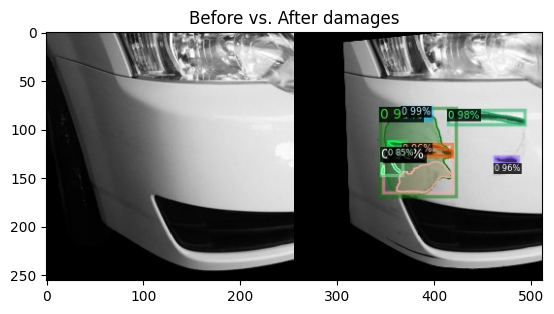

---------------------
All damages are new, there were no existing damages


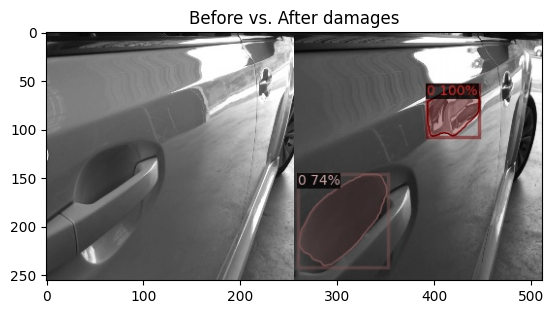

---------------------
No damages are detected in Before or After images


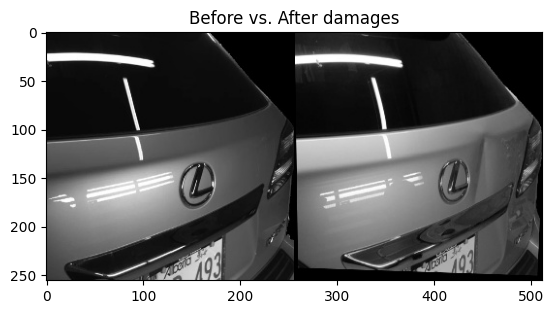

---------------------
The are existing damages, as well as new damages:


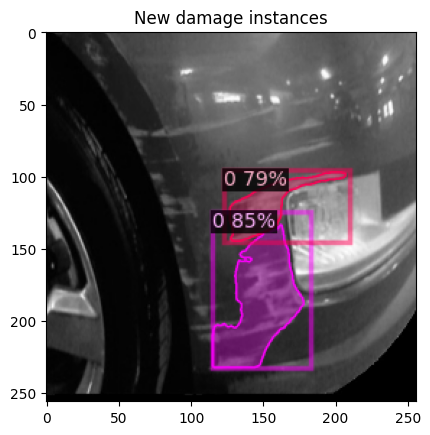

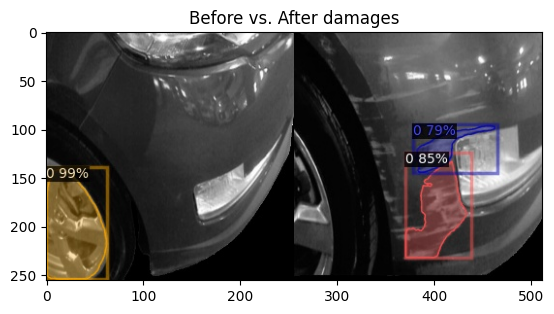

---------------------
Error: Existing damages were not detected in after image


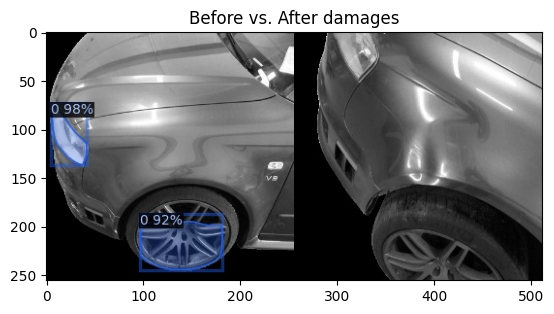

---------------------
The are existing damages, as well as new damages:


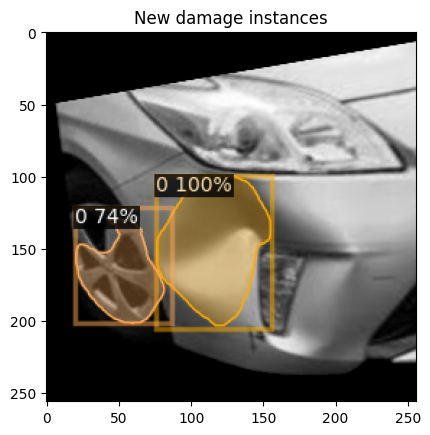

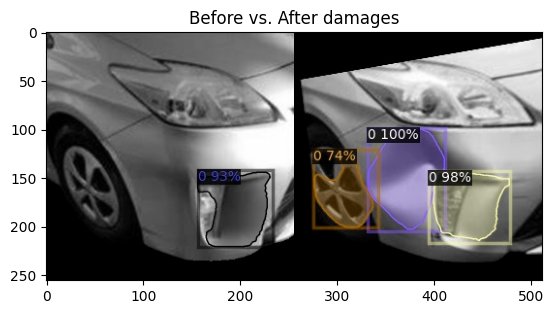

---------------------
No damages are detected in Before or After images


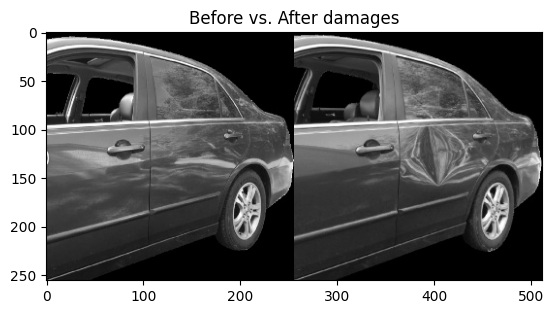

---------------------
All damages are new, there were no existing damages


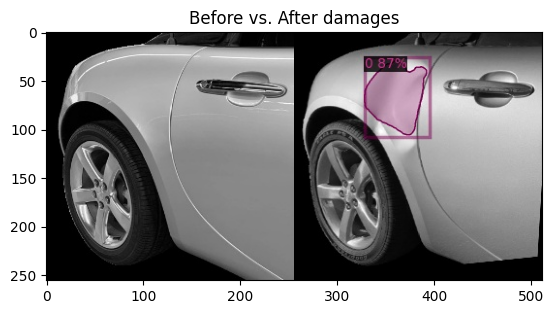

---------------------
No damages are detected in Before or After images


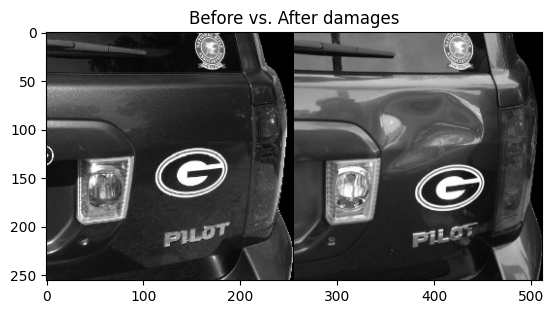

---------------------


In [316]:
from detectron2.structures import Boxes
from detectron2.evaluation import inference_on_dataset
from detectron2.utils.visualizer import Visualizer
from detectron2.structures.boxes import pairwise_iou

for i in range(1,10):
    outputs_1= all_outputs["before_images"][i-1][1]
    instances_1 = outputs_1["instances"].to("cpu") 
    outputs_2= all_outputs["aligned_images"][i-1][1]
    instances_2 = outputs_2["instances"].to("cpu")
    boxes_1 = instances_1.pred_boxes.tensor.numpy()
    boxes_2 = instances_2.pred_boxes.tensor.numpy()
    classes_1 = instances_1.pred_classes.numpy()
    classes_2 = instances_2.pred_classes.numpy()

    iou_matrix = pairwise_iou(Boxes(boxes_2), Boxes(boxes_1))

    # CASE 1: There are no existing damages
    if len(instances_1) == 0:
        # CASE 1a: There are no before OR after damages
        if len(instances_2) == 0:
            print("No damages are detected in Before or After images")
        # CASE 1b: There are only new damages in after image
        else:
            print("All damages are new, there were no existing damages")

    # CASE 2: There are existing damages
    else: 
        threshold = 0.5 # if 50% or more of the bounding boxes overlap, classify them as the same damage
        new_damage_instances = []
        for index, box in enumerate(boxes_2):
            max_iou = iou_matrix[index].max().item()
            matched_class = classes_2[index] in classes_1
            if max_iou < threshold or not matched_class:
                # add index of new instances
                new_damage_instances.append(index)

        # CASE 2a: No new damages besides existing ones 
        if len(new_damage_instances) == 0:
            # CASE 2b: Existing damages were detected, but they are not detected in after image
            if len(instances_2) == 0:
                print("Error: Existing damages were not detected in after image")
            else:
                print("There were existing damages, but there are no NEW damages")
        # CASE 2c: There are existing AND new damages
        else:
            print("The are existing damages, as well as new damages:")
            # print(new_instances)

            # Visualize the new damage instances only
            im = cv2.imread(f"aligned_after_images/image{i}.jpg")
            v = Visualizer(im[:, :, ::-1],
                        metadata=test_metadata,  
                        scale=0.5, 
                        instance_mode=ColorMode.IMAGE_BW
            )
            out = v.draw_instance_predictions(instances_2[new_damage_instances])
            plt.imshow(out.get_image()[:, :, ::-1], cmap='gray')
            plt.title("New damage instances")
            plt.show()

    before = cv2.imread(f"predictions/before_preds/image{i}.jpg")
    after = cv2.imread(f"predictions/aligned_after_preds/image{i}.jpg")
    plt.imshow(np.hstack((before,after)))
    plt.title("Before vs. After damages")
    plt.show()
    print("---------------------")
        